Notebook for the MITHIC event Aug 18 2025

# WorldMedQA-V

## Libraries

In [ ]:
import base64
from PIL import Image
from io import BytesIO
from IPython.display import display, HTML
from huggingface_hub import hf_hub_download
import pandas as pd

## Function to load .tsv files from HuggingFace

In [ ]:
def load_tsv_files(repo_id, filenames):
    """
    Downloads and loads TSV files from HuggingFace Hub.

    Parameters:
    repo_id (str): The repository ID on the HuggingFace Hub.
    filenames (list): List of TSV filenames to download and load.

    Returns:
    dict: A dictionary with filenames as keys and the loaded datasets
    (pandas DataFrames) as values.

    """

    datasets = {}

    for filename in filenames:
        file_path = hf_hub_download(repo_id=repo_id, filename=filename,
                                    repo_type="dataset")
        datasets[filename] = pd.read_csv(file_path, sep='\t')

        print(f"Loaded {filename} from {repo_id}")

    return datasets



In [ ]:
# Name of the Dataset
REPO_ID = "WorldMedQA/V"

# List of filenames
tsv_files = [
    "brazil_english_processed.tsv",
    "brazil_local_processed.tsv",
    "israel_english_processed.tsv",
    "israel_local_processed.tsv",
    "japan_english_processed.tsv",
    "japan_local_processed.tsv",
    "spain_english_processed.tsv",
    "spain_local_processed.tsv"
]

datasets = load_tsv_files(repo_id=REPO_ID, filenames=tsv_files)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loaded brazil_english_processed.tsv from WorldMedQA/V
Loaded brazil_local_processed.tsv from WorldMedQA/V
Loaded israel_english_processed.tsv from WorldMedQA/V
Loaded israel_local_processed.tsv from WorldMedQA/V
Loaded japan_english_processed.tsv from WorldMedQA/V
Loaded japan_local_processed.tsv from WorldMedQA/V
Loaded spain_english_processed.tsv from WorldMedQA/V
Loaded spain_local_processed.tsv from WorldMedQA/V


In [ ]:
list(datasets.keys())

['brazil_english_processed.tsv',
 'brazil_local_processed.tsv',
 'israel_english_processed.tsv',
 'israel_local_processed.tsv',
 'japan_english_processed.tsv',
 'japan_local_processed.tsv',
 'spain_english_processed.tsv',
 'spain_local_processed.tsv']

In [ ]:
brazil_english_df = datasets["brazil_english_processed.tsv"]
brazil_local_df = datasets["brazil_local_processed.tsv"]

In [ ]:
# columns
brazil_local_df.head(0)

,index,image,question,A,B,C,D,answer,correct_option,split


In [ ]:
# first row example
brazil_local_df.head(1)

,index,image,question,A,B,C,D,answer,correct_option,split
0,1,iVBORw0KGgoAAAANSUhEUgAAArAAAADCCAYAAACxMfFVAA...,"Adolescente, após tentativa de suicídio com in...","taquicardia ventricular, que pode ser responsi...","fi brilação ventricular, que pode ser responsi...","fi brilação ventricular, que pode ser responsi...","taquicardia ventricular, que pode ser responsi...",NaN,D,test


## Function to display base64 Images

In [ ]:
def display_base64_image(encoded_string, width=None, height=None):
    """
    Decodes a base64 string, resizes it while maintaining the aspect ratio, and displays it as an image in Google Colab.

    Parameters:
    encoded_string (str): Base64 encoded string of the image.
    width (int, optional): The desired width of the image. Defaults to None.
    height (int, optional): The desired height of the image. Defaults to None.
    """
    # Decode the base64 string
    image_data = base64.b64decode(encoded_string)
    image = Image.open(BytesIO(image_data))

    # Resize the image while keeping the aspect ratio
    if width or height:
        original_width, original_height = image.size

        # If only width is provided, calculate height to maintain aspect ratio
        if width and not height:
            height = int((width / original_width) * original_height)
        # If only height is provided, calculate width to maintain aspect ratio
        elif height and not width:
            width = int((height / original_height) * original_width)

        # Resize the image
        image = image.resize((width, height), Image.Resampling.LANCZOS)

    # Display the image
    display(image)


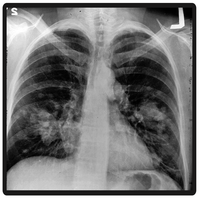

In [ ]:
base64_image = brazil_local_df[brazil_local_df["index"] == 9]["image"].values[0]
display_base64_image(base64_image, width=200)

## Function to display exam QAs

In [ ]:
def display_exam_question(df, index, width=None):
    """
    Displays an exam question based on the data in the DataFrame, including the question text, image, and options.

    Parameters:
    df (pd.DataFrame): DataFrame containing the exam question data.
    index (int): Index of the question in the DataFrame.
    width (int, optional): Width for resizing the image. Defaults to None.
    """
    # Extract the row data
    row = df[df["index"] == index].iloc[0]

    # Display the question
    question_text = f"<b>Question {index}:</b> {row['question']}<p><p>"
    display(HTML(question_text))

    # Display the image
    display_base64_image(row['image'], width=width)

    # Display the options
    options = ['A', 'B', 'C', 'D', 'E']
    formatted_options = []

    for option in options:
        if pd.isna(row.get(option)):
            continue  # Skip if the option doesn't exist
        # Bold the correct option
        if option == row['correct_option']:
            formatted_options.append(f"<p><b>{option}. {row[option]}</b>")
        else:
            formatted_options.append(f"<p>{option}. {row[option]}")

    # Join the formatted options with line breaks and display
    display(HTML("<br>".join(formatted_options)))

## A couple of examples

### Brazil

Original Portuguese


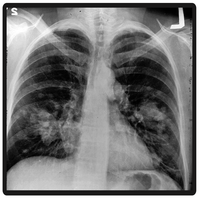


English Translation


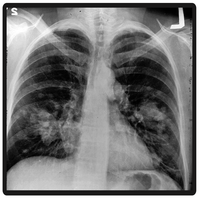

In [ ]:
QUESTION_NO = 9
IMG_WIDTH = 200

print('Original Portuguese')
display_exam_question(brazil_local_df, index=QUESTION_NO, width=IMG_WIDTH)

print('\nEnglish Translation')
display_exam_question(brazil_english_df, index=QUESTION_NO, width=IMG_WIDTH)


Original Portuguese


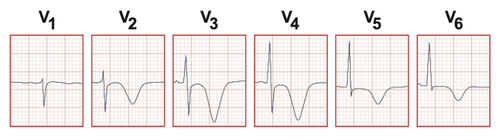


English Translation


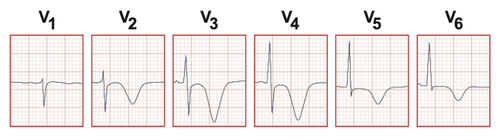

In [ ]:
QUESTION_NO = 10
IMG_WIDTH = 500

print('Original Portuguese')
display_exam_question(brazil_local_df, index=QUESTION_NO, width=IMG_WIDTH)

print('\nEnglish Translation')
display_exam_question(brazil_english_df, index=QUESTION_NO, width=IMG_WIDTH)


### Israel

Original Hebrew


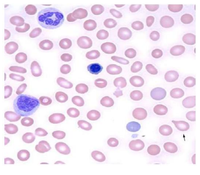


English Translation


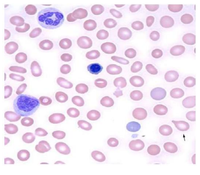

In [ ]:
israel_english_df = datasets["israel_english_processed.tsv"]
israel_local_df = datasets["israel_local_processed.tsv"]

QUESTION_NO = 11
IMG_WIDTH = 200

print('Original Hebrew')
display_exam_question(israel_local_df, index=QUESTION_NO, width=IMG_WIDTH)

print('\nEnglish Translation')
display_exam_question(israel_english_df, index=QUESTION_NO, width=IMG_WIDTH)


### Japan

Original Japanese


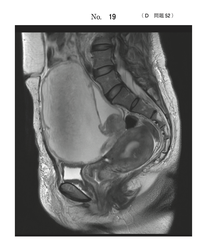


English Translation


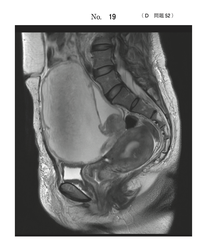

In [ ]:
japan_english_df = datasets["japan_english_processed.tsv"]
japan_local_df = datasets["japan_local_processed.tsv"]

QUESTION_NO = 60
IMG_WIDTH = 200

print('Original Japanese')
display_exam_question(japan_local_df, index=QUESTION_NO, width=IMG_WIDTH)

print('\nEnglish Translation')
display_exam_question(japan_english_df, index=QUESTION_NO, width=IMG_WIDTH)


### Spain

Original Spanish


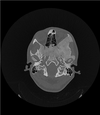


English Translation


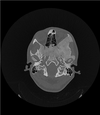

In [ ]:
spain_english_df = datasets["spain_english_processed.tsv"]
spain_local_df = datasets["spain_local_processed.tsv"]

QUESTION_NO = 11
IMG_WIDTH = 100

print('Original Spanish')
display_exam_question(spain_english_df, index=QUESTION_NO, width=IMG_WIDTH)

print('\nEnglish Translation')
display_exam_question(spain_local_df, index=QUESTION_NO, width=IMG_WIDTH)


# WorldMedQA_T

## Random Sample from WorldMedQA-T

This preview contains **240 examples** drawn from **11 countries** and representing **10 languages**.

- **Countries**: Argentina, Brazil, China, Egypt, Ethiopia, Iran, Israel, Japan, South Korea, Lebanon, Spain  
- **Languages**: Arabic, English, French, Hebrew, Japanese, Korean, Mandarin, Persian, Portuguese, Spanish  

Questions may include **four or five answer options**.  

Each row provides the question and answer in the **official language of the country** (when available), along with the corresponding **English translation**. If no local-language version is available, the content is provided in **English only**.


In [38]:
import pandas as pd
from IPython.display import display, HTML


df = pd.read_csv("./MITHIC_event_2025Aug18.csv")
df.head(1)

,country,language,source,question,A,B,C,D,E,correct_option,question_EN,A_EN,B_EN,C_EN,D_EN,E_EN
0,JP,JP,national_official_exam_official_source,睡眠時無呼吸症候群による高血圧について、正しくないのはどれか。,夜間高血圧となることが多い。,肥満患者では減量を推奨する。,α 遮断薬が第一選択薬である。,家庭血圧では早朝に高血圧となることが多い。,持続的気道陽圧法（CPAP）で降圧が期待される。,C,Which of the following is not true regarding h...,Nocturnal hypertension is common.,Weight loss is encouraged in obese patients.,Alpha-blockers are the first-line treatment.,Home blood pressure often becomes high in the ...,Continuous positive airway pressure (CPAP) is ...


In [39]:
country_list = df["country"].unique().tolist()
language_list = df["language"].unique().tolist()

print("Countries in the dataset:", country_list)
print("Languages in the dataset:", language_list)

Countries in the dataset: ['JP', 'BR', 'CN', 'IR', 'IS', 'LB', 'ES', 'KR', 'ET', 'AR', 'EG']
Languages in the dataset: ['JP', 'PT', 'ZH', 'FA', 'HE', 'AR', 'FR', 'ES', 'KR', 'EN']


In [59]:
def display_question_country(df, country, index, language = None):
    """
    Displays an exam question based on the data in the DataFrame, including the question text and options, and its english translation.

    Parameters:
    df (pd.DataFrame): DataFrame containing the exam question data.
    country (str): The country for which the question is being displayed.
    index (int): Index of the question in the DataFrame.
    language (str, optional): The language of the question. Defaults to None.
    """

    # Filter the DataFrame for the specified country
    df_country = df[df["country"] == country].reset_index(drop=True)

    if language:
        # Further filter by language if specified
        df_country = df_country[df_country["language"] == language].reset_index(drop=True)
    
    # Extract the row data
    row = df_country.iloc[index]
    # Display the question
    question_text = f"<b>Question {index}:</b> {row['question']}<p><p>"
    display(HTML(question_text))
    
    # Display the options
    options = ['A', 'B', 'C', 'D', 'E']
    formatted_options = []
    formatted_options_EN = []

    for option in options:
        if pd.isna(row.get(option)):
            continue  # Skip if the option doesn't exist
        # Bold the correct option
        if option == row['correct_option']:
            formatted_options.append(f"<p><b>{option}. {row[option]}</b>")
        else:
            formatted_options.append(f"<p>{option}. {row[option]}")

    # Join the formatted options with line breaks and display
    display(HTML("<br>".join(formatted_options)))

    if 'question_EN' in row:
        question_text_EN = f"<b>Question_EN {index}:</b> {row['question_EN']}<p><p>"
        display(HTML(question_text_EN))

        options_EN = ['A_EN', 'B_EN', 'C_EN', 'D_EN', 'E_EN']

        for option in options_EN:
            if pd.isna(row.get(option)):
                continue  # Skip if the option doesn't exist
            # Bold the correct option
            if option == row['correct_option']  + '_EN':
                formatted_options_EN.append(f"<p><b>{option}. {row[option]}</b>")
            else:
                formatted_options_EN.append(f"<p>{option}. {row[option]}")

        # Join the formatted options with line breaks and display
        display(HTML("<br>".join(formatted_options_EN)))

    

In [58]:
display_question_country(df, country="EG", index=0)

# Playground

Here are some directions and questions for your activity:

1. **Model performance across languages**  
   GPT-5 scores 95.84% on MedQA [(ref)](https://arxiv.org/pdf/2508.08224), but how well does it perform in other languages represented in our dataset?  

2. **Representation of sociodemographic groups**  
   Are certain groups (e.g., age, gender, race, sexuality) under- or over-represented in medical exam scenarios?  

3. **Cultural norms and taboos**  
   To what extent do exam questions reflect (or reinforce) stigma around mental health, STIs, or LGBTQ+ care?  

4. **Health system values**  
   Do national exams emphasize prevention vs. intervention differently, reflecting the priorities of their health systems?  

5. **Topic frequencies vs. local health priorities**  
   Do exam topics (e.g., maternal health, pediatrics, NCDs) correlate with the actual disease burden or policy focus in each country?  

6. **Cross-country comparison of health equity framing**  
   How do exams in Japan, Spain, Brazil, and others address social determinants of health, preventive care, or inequities?  

7. **Translation shifts**  
   How does the translation of key clinical terms (e.g., *pain*, *distress*, *compliance*) alter their meaning across languages and cultures?  

8. **Varieties of language**  
   Are there detectable differences in question framing across varieties of English (e.g., Egypt vs. Ethiopia) or Spanish (e.g., Spain vs. Argentina)?  

9. **✨ Open brainstorming!**  
   What other fresh ideas, perspectives, or critiques ?